In [11]:
using Revise  # auto reload

includet("State_Space_Model.jl")
using .state_space_model

includet("Kalman.jl")
using .kalman

includet("MCMC.jl")
using .MCMC

using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions
using Plots
using StatsPlots
using CSV
using DataFrames


## Model & Priors

In [12]:
# Parameters in θ
# θ_elements = ["ρ", "λ_c", "c₁", "c₂", "v_ε, y", "v_ξ, y", "v_κ, y", "σ²_ε, y", "σ²_ξ, y", "σ²_κ, y", "σ²_ε, π", "σ²_ξ, π", "σ²_κ, π"]
θ_elements = ["ρ", "λ_c", "c₁", "c₂", "σ²_ε, y", "σ²_ξ, y", "σ²_κ, y", "σ²_ε, π", "σ²_ξ, π", "σ²_κ, π"]
n_params = length(θ_elements)
cycle_order = 2

# List of prior distributions 
prior_distributions = (
    "uniform", # ρ
    "beta", # λ_c
    "uniform", # c₁
    "uniform", # c₂
    "uniform", # σ²_ε, y
    "uniform", # σ²_ξ, y
    "uniform", # σ²_κ, y
    "uniform", # σ²_ε, π
    "uniform", # σ²_ξ, π
    "uniform", # σ²_κ, π
    )

# matrix of prior hyperparameters.
prior_hyperparameters = [ 
    0.001 0.99; # ρ
    2.0 5.0; # λ_c
    0.0 1.0; # c₁
    0.0 1.0; # c₂
    0.0 1e6; # σ²_ε, y
    0.0 1e6; # σ²_ξ, y
    0.0 1e6; # σ²_κ, y
    0.0 1e6; # σ²_ε, π
    0.0 1e6; # σ²_ξ, π
    0.0 1e6; # σ²_κ, π
    ]


# Create the support matrix in the same way.
support = [
    0.0 1.0; # ρ
    0.0 3.0; # λ_c
    0.0 1.0; # c₁
    0.0 1.0; # c₂
    0.0 Inf; # σ²_ε, y
    0.0 Inf; # σ²_ξ, y
    0.0 Inf; # σ²_κ, y
    0.0 Inf; # σ²_ε, π
    0.0 Inf; # σ²_ξ, π
    0.0 Inf; # σ²_κ, π
    ]


# Combine into a named tuple
prior_info = (
    support = support,
    distributions = prior_distributions,
    parameters = prior_hyperparameters,
)



#States in α
α_elements = [
    "u_t^y", 
    "β_t^y", 
    "u_t^π", 
    "β_t^π", 
    "ψ_{2,t}^y", 
    "ψ_{2,t}^{y*}", 
    "ψ_{1,t}^y", 
    "ψ_{1,t}^{y*}", 
    "ψ_{2,t}^π", 
    "ψ_{2,t}^{π*}", 
    "ψ_{1,t}^π", 
    "ψ_{1,t}^{π*}", 
    "tilde{ψ}_t^y", 
    "tilde{ψ}_{t-1}^y"
]




14-element Vector{String}:
 "u_t^y"
 "β_t^y"
 "u_t^π"
 "β_t^π"
 "ψ_{2,t}^y"
 "ψ_{2,t}^{y*}"
 "ψ_{1,t}^y"
 "ψ_{1,t}^{y*}"
 "ψ_{2,t}^π"
 "ψ_{2,t}^{π*}"
 "ψ_{1,t}^π"
 "ψ_{1,t}^{π*}"
 "tilde{ψ}_t^y"
 "tilde{ψ}_{t-1}^y"

## Data

(2, 276)


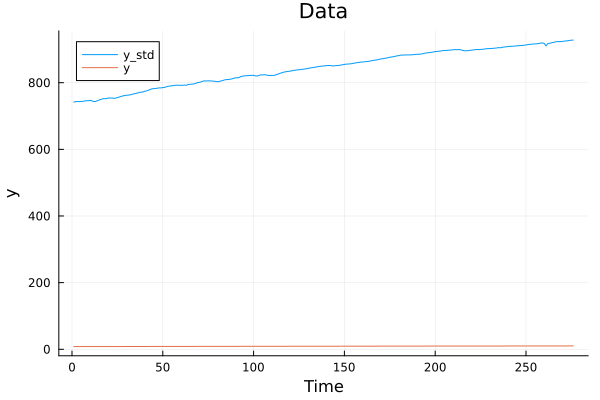

14×14 Matrix{Float64}:
 100.0    0.0    0.0    0.0    0.0  …    0.0    0.0    0.0    0.0    0.0
   0.0  100.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0  100.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0  100.0    0.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0  100.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0  …    0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0     100.0    0.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0  …    0.0  100.0    0.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0       0.0    0.0  100.0    0.0    0.0
   0.0    0.0    0.0    0.0    0.0       0.0    0.0    0.0  100.0    0.0
   0.0    0.0    0.0    0.0 

In [13]:
simulate = false

if simulate
    # True parameters
    ρ = 0.7
    λ_c = 0.5
    c₁ = 0.7
    c₂ = 0.02
    # v_ε = -0.028*10e-7
    # v_ξ = -0.22*10e-7
    # v_κ = 0.04*10e-7
    # σ²_ε_y = 40*10e-7
    # σ²_ξ_y = 26*10e-7
    # σ²_κ_y = 272*10e-7
    # σ²_ε_π = 5241*10e-7
    # σ²_ξ_π = 5.97*10e-7
    # σ²_κ_π = 112.5*10e-7
    σ²_ε_y = 0.02
    σ²_ξ_y = 0.05
    σ²_κ_y = 0.01
    σ²_ε_π = 0.09
    σ²_ξ_π = 0.001
    σ²_κ_π = 0.002

    # θ_true = [ρ, λ_c, c₁, c₂, v_ε, v_ξ, v_κ, σ²_ε_y, σ²_ξ_y, σ²_κ_y, σ²_ε_π, σ²_ξ_π, σ²_κ_π]
    θ_true = [ρ, λ_c, c₁, c₂, σ²_ε_y, σ²_ξ_y, σ²_κ_y, σ²_ε_π, σ²_ξ_π, σ²_κ_π]


    Random.seed!(123)
    n_obs = 200
    y, α = simulate_data(θ_true, cycle_order, n_obs)
    y_std, σʸ = standardize_data(y)
    
else
    # Load data
    data = CSV.read("data.csv", DataFrame)
    # Extract y and π
    y = data.y
    y = log.(y)
    π = data.π

    # join data in 2*nobs Matrix
    y = hcat(y, π)
    y = y'
    println(size(y))
    y_std, σʸ = standardize_data(y)
    n_obs = length(y)
end


# plot data
plot(y_std[1,:], label="y_std", title="Standardized data", xlabel="Time", ylabel="y", legend=:topleft)
plot!(y[1,:], label="y", title="Data", xlabel="Time", ylabel="y", legend=:topleft)
display(plot!())

# Initial states
α0 = zeros(length(α_elements))
α0[1] = y[1,1]
α0[3] = y[2,1]
P0 = 100*Matrix{Float64}(I, length(α_elements), length(α_elements))

## MCMC

In [14]:
θ_0 = [0.5, 0.8, 0.2, 0.5, 0.2, 0.0001, 0.1, 0.05, 0.1, 0.05]

θ_chain, θ_chain_init, α_draws = MCMC_estimation(y_std, prior_info, α0, P0, cycle_order, σʸ;
 iter_init = 20000, 
 burn_init = 10000,
 iter_rec = 15000,
burn_rec = 10000,
θ_init = θ_0,
ω = 0.01)

Initialization Phase 100%|███████████████████████████████| Time: 0:01:51


Initialization Acceptance Rate: 30.255%


Recursion Phase 100%|████████████████████████████████████| Time: 0:03:13


Recursion Acceptance Rate: 31.633333333333336%


([0.554192873699846 0.0007368059583188013 … 0.001159711729205024 16.40084487131451; 0.5760483913227338 0.0009396225683998635 … 0.0012886224298264237 3.9789049297629835; … ; 0.5567622223200754 7.5884347523028015e-6 … 0.002473530028357722 239242.3163036685; 0.5567622223200754 7.5884347523028015e-6 … 0.002473530028357722 239242.3163036685], [0.49500704683145946 0.73576710379051 … 0.10298945675673564 0.04995857361083874; 0.5109246035342991 0.7811420420642105 … 0.09628876452591072 0.05879453859494336; … ; 0.5104895961067466 5.1246275425586015e-5 … 0.0006651772210014596 10558.881035777922; 0.5104895961067466 5.1246275425586015e-5 … 0.0006651772210014596 10558.881035777922], [8.044934473932152 0.0014318867718934314 … 3.237040778122048 5.494300590785889; 7.989847035639546 0.006464383916814809 … 3.2938467562173734 3.0677374131539024; … ; 8.01196392208324 0.004204928059024837 … -1.5465212780897133 0.2968928600515426; 7.977436220310251 0.010057420402912687 … -9.99767876325332 0.42850496868276355;

Initial chain shape: (20000, 10)


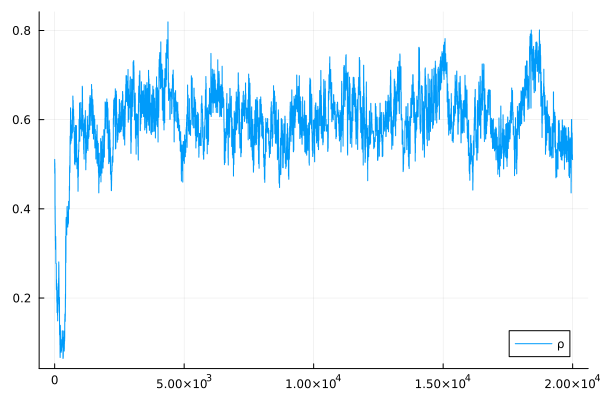

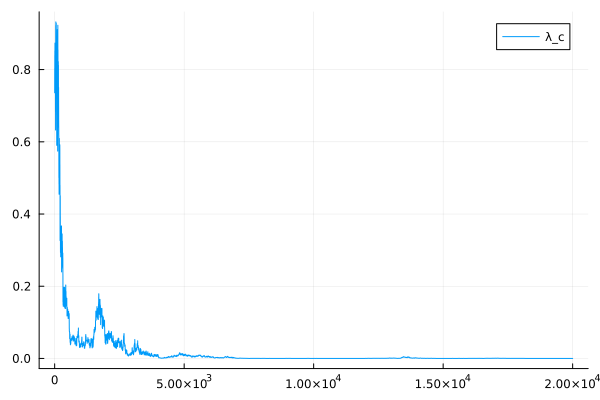

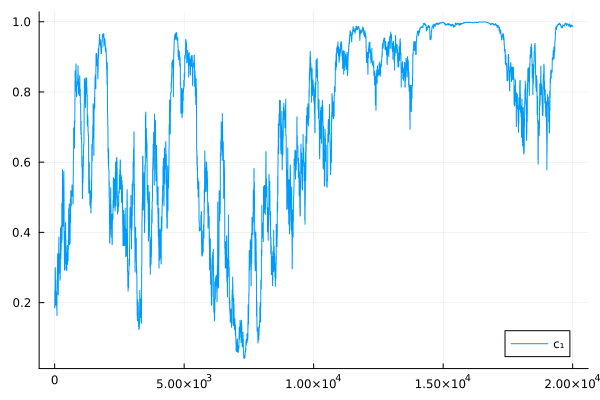

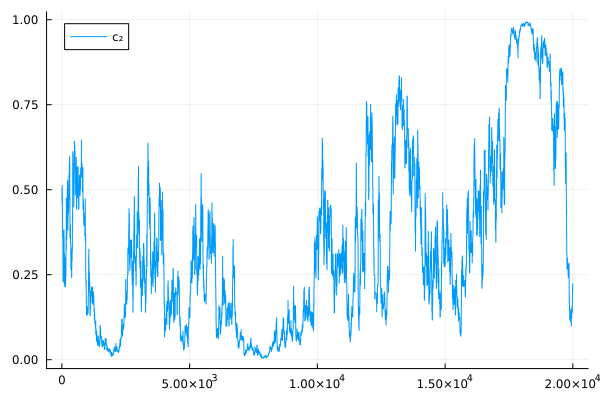

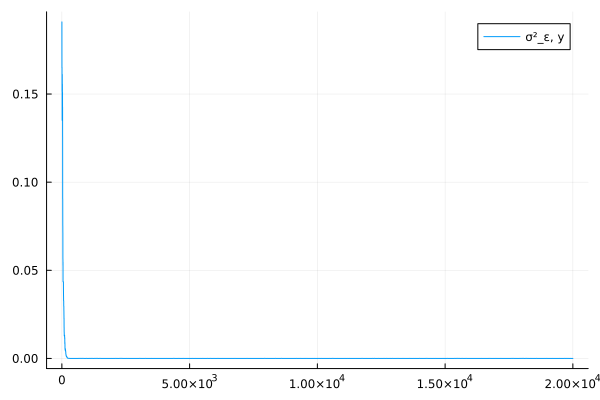

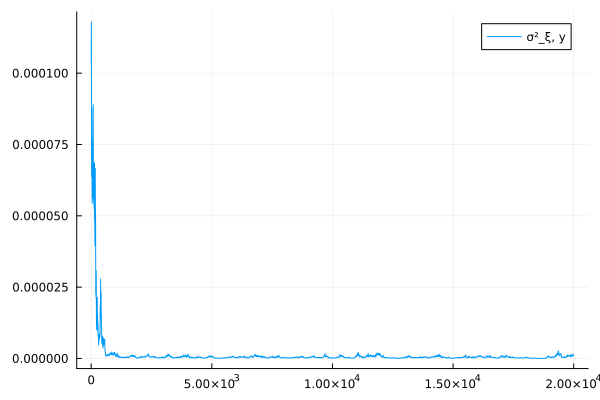

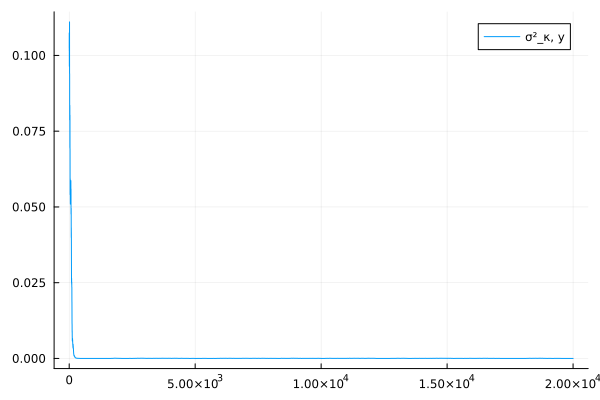

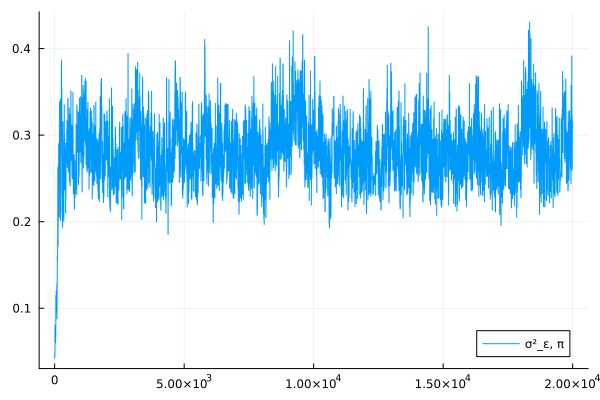

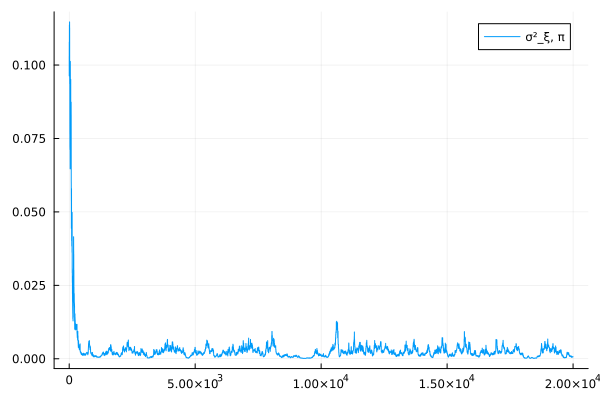

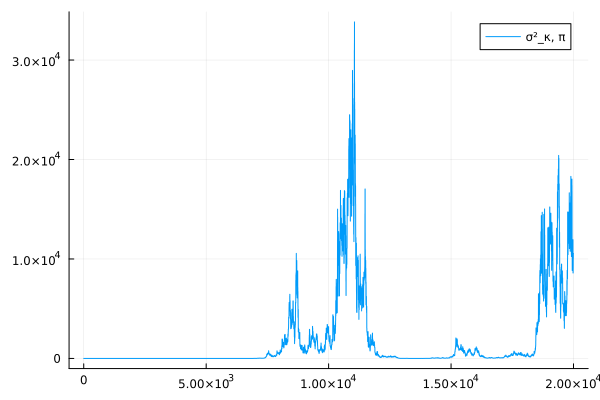

In [15]:
println("Initial chain shape: ", size(θ_chain_init))
#Print trace plot and add true value
for i in 1:size(θ_chain_init, 2)
    plot(θ_chain_init[:,i], label="$(θ_elements[i])")
    if simulate
        hline!([θ_true[i]], label="true $(θ_elements[i])")
    end
    display(plot!())
end

Rec chain shape: (5000, 10)


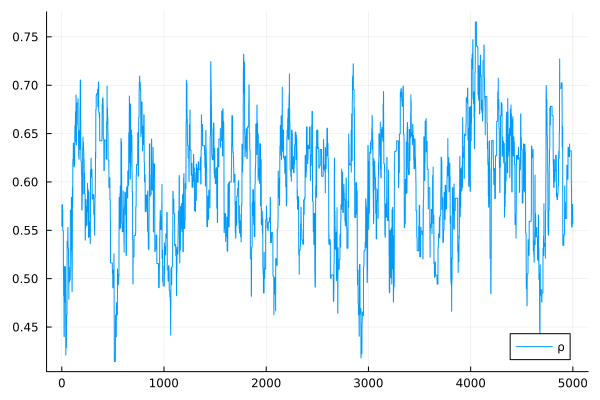

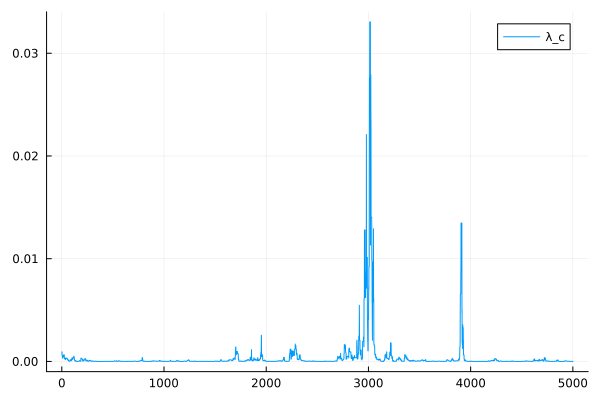

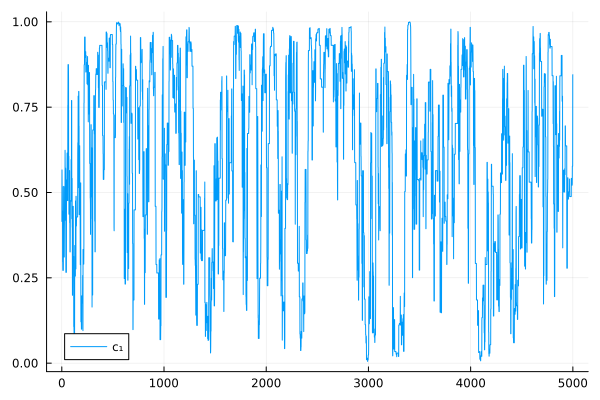

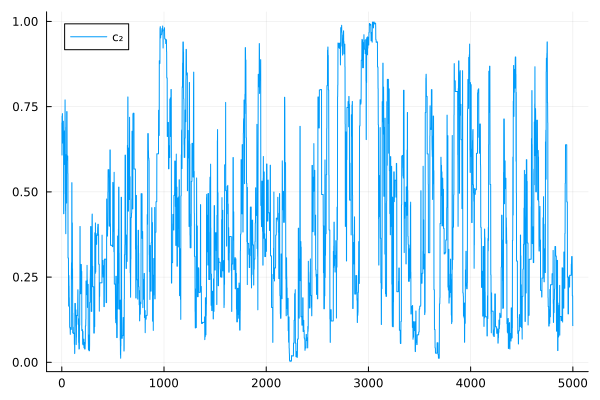

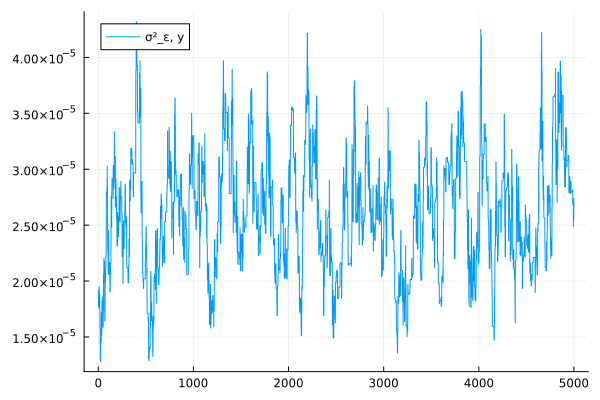

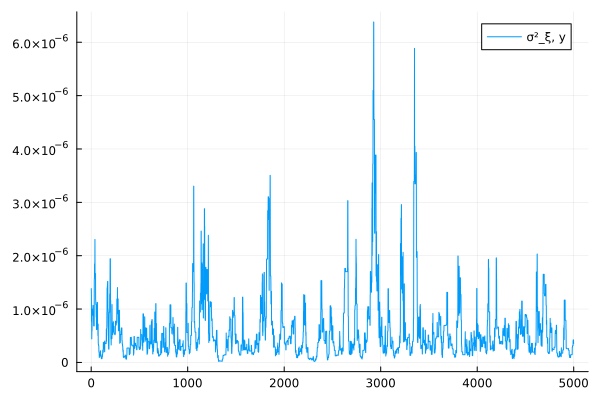

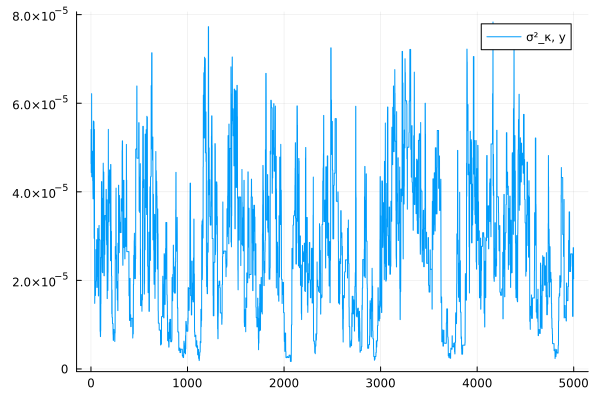

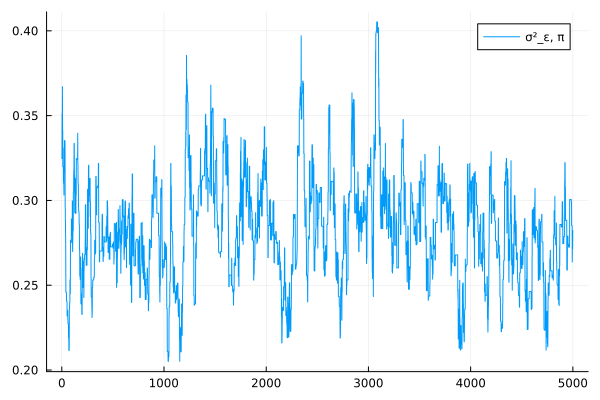

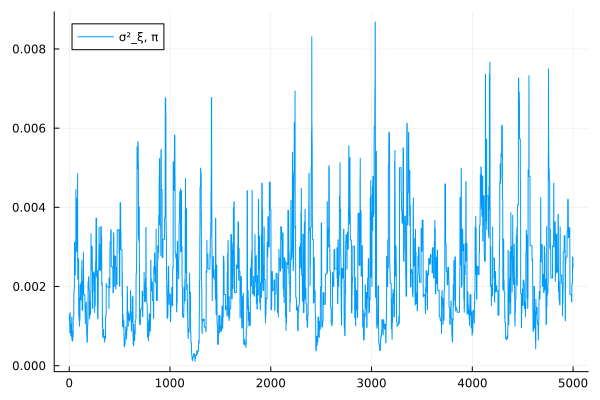

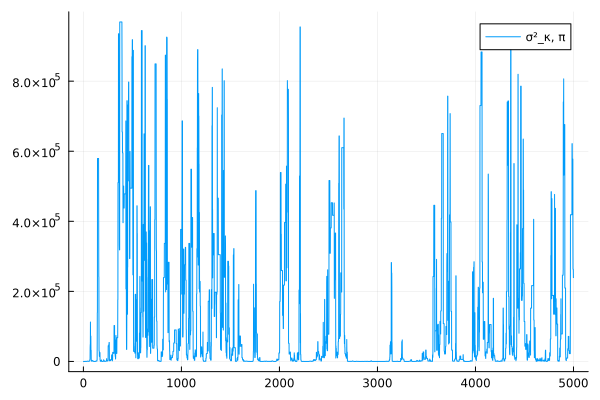

In [16]:
println("Rec chain shape: ", size(θ_chain))

#Print trace plot and add true value
for i in 1:size(θ_chain, 2)
    plot(θ_chain[:,i], label="$(θ_elements[i])")
    if simulate
        hline!([θ_true[i]], label="true $(θ_elements[i])")
    end
    display(plot!())
end



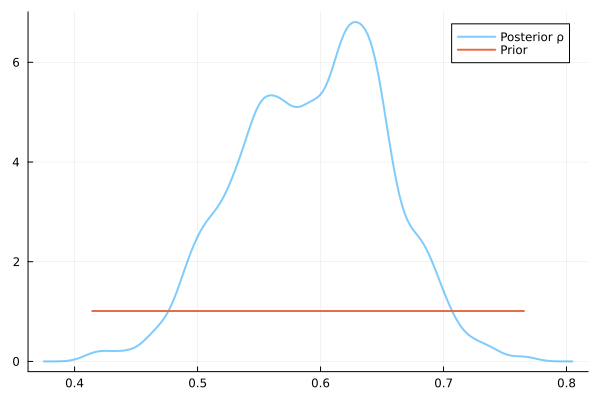

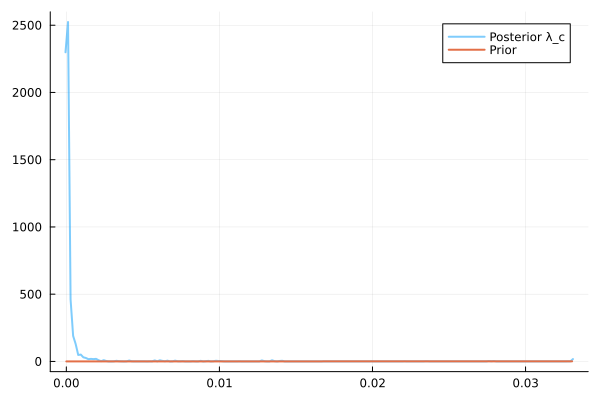

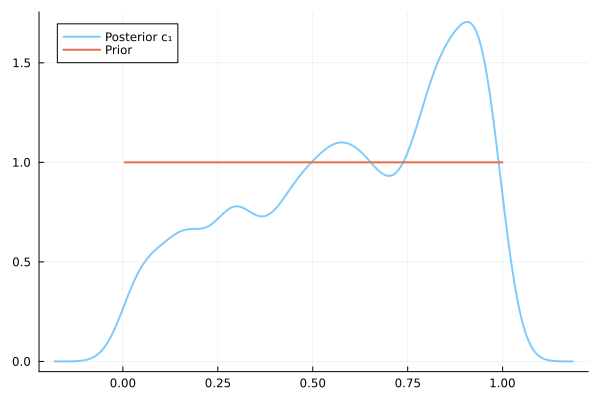

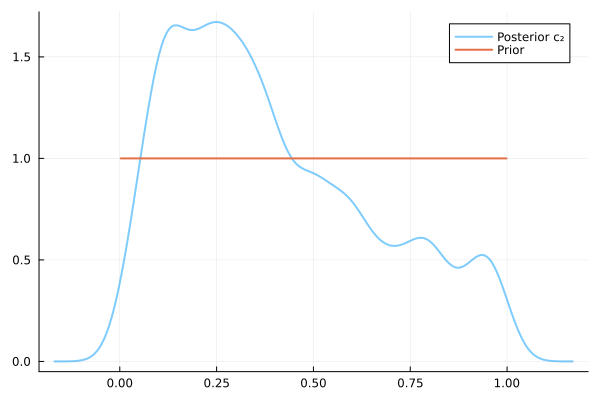

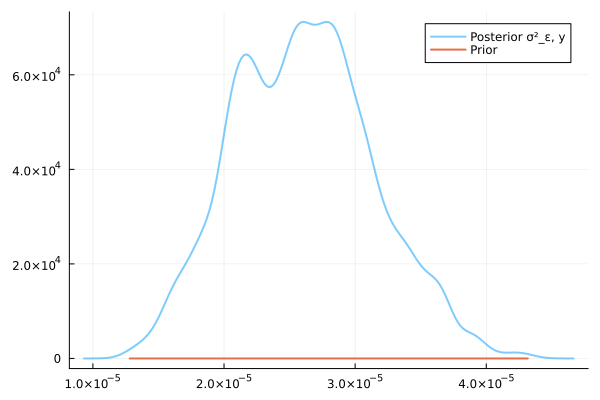

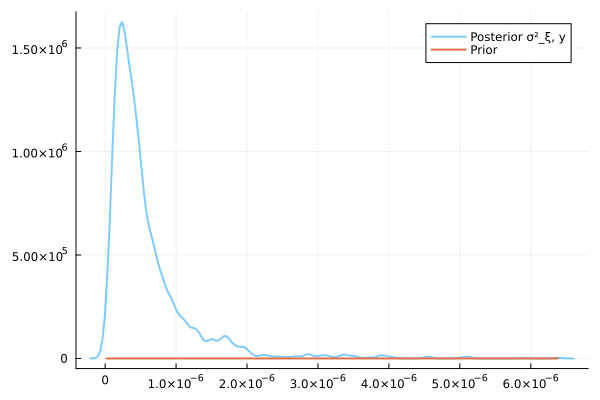

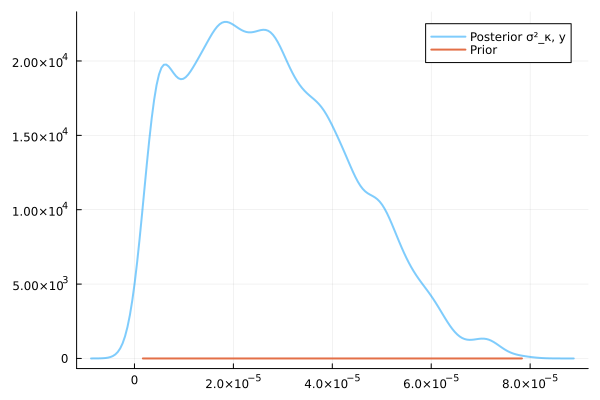

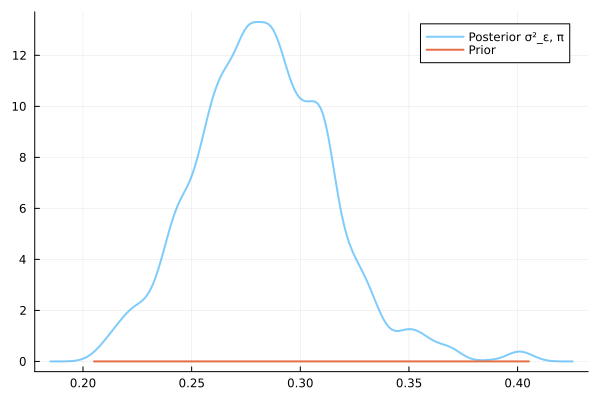

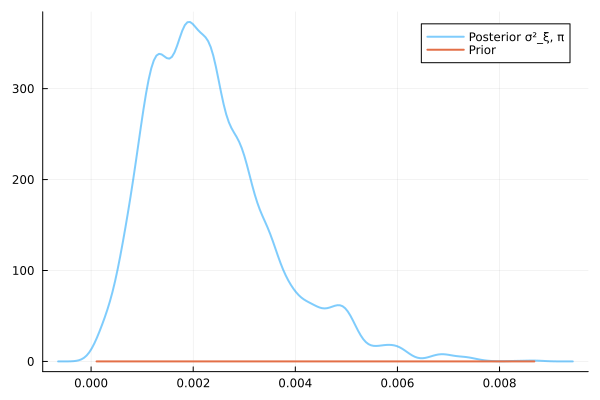

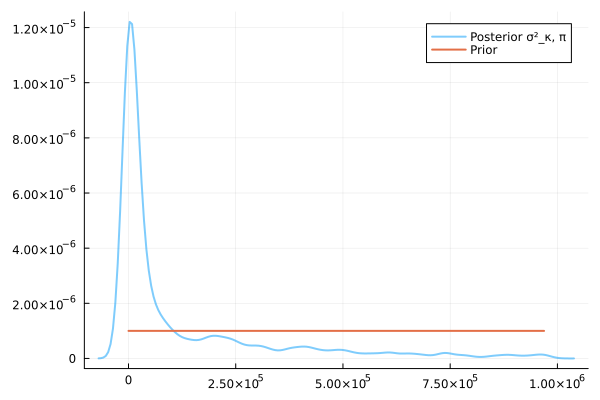

In [17]:

# Iterate through each parameter's chain
for i in 1:size(θ_chain, 2)
    # Plot kernel density estimate of the posterior
    density(θ_chain[:,i], label="Posterior $(θ_elements[i])", alpha=0.5, linewidth=2)

    # Prior distribution
    if prior_distributions[i] == "uniform"
        prior = Uniform(prior_hyperparameters[i,1], prior_hyperparameters[i,2])
    elseif prior_distributions[i] == "beta"
        prior = Beta(prior_hyperparameters[i,1], prior_hyperparameters[i,2])
    elseif prior_distributions[i] == "normal"
        prior = Normal(prior_hyperparameters[i,1], prior_hyperparameters[i,2])
    elseif prior_distributions[i] == "inverse gamma"
        prior = InverseGamma(prior_hyperparameters[i,1], prior_hyperparameters[i,2])
    end
    x_vals = range(minimum(θ_chain[:,i]), maximum(θ_chain[:,i]), length=100)
    plot!(x_vals, pdf.(prior, x_vals), label="Prior", linewidth=2)

    # True value
    if simulate
        vline!([θ_true[i]], label="True $(θ_elements[i])", linestyle=:dash, color=:red)
    end

    # Display the plot
    display(plot!())
end


Mean of α_draws: (1, 14, 276)


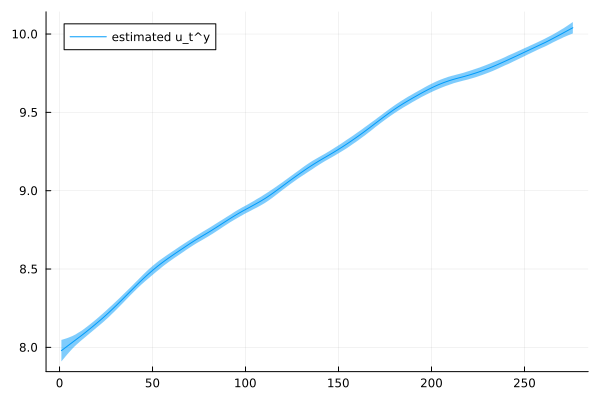

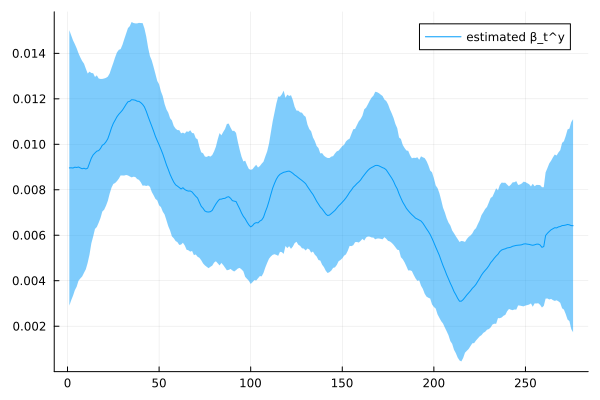

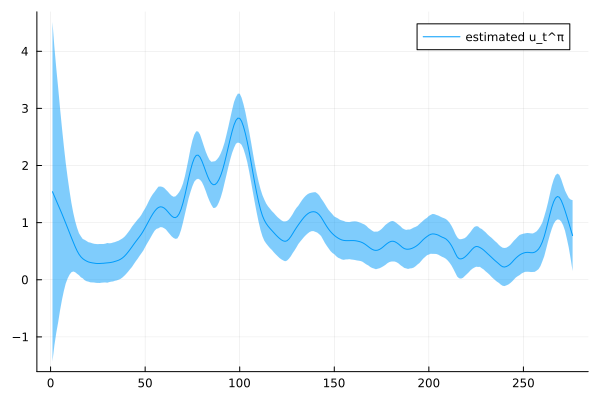

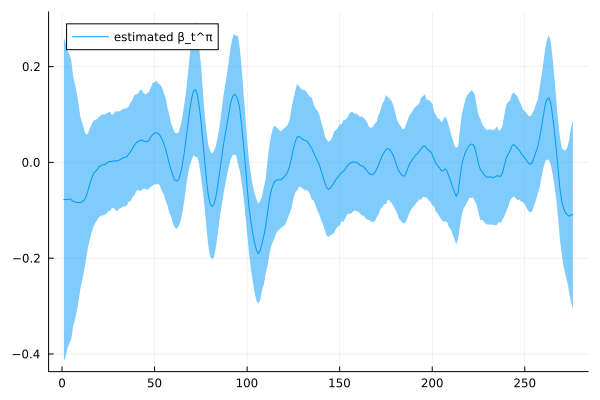

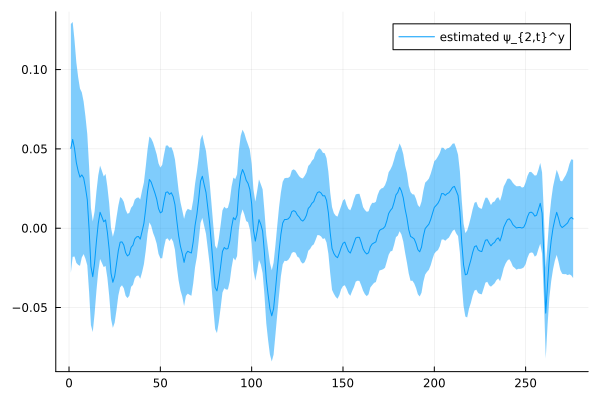

...

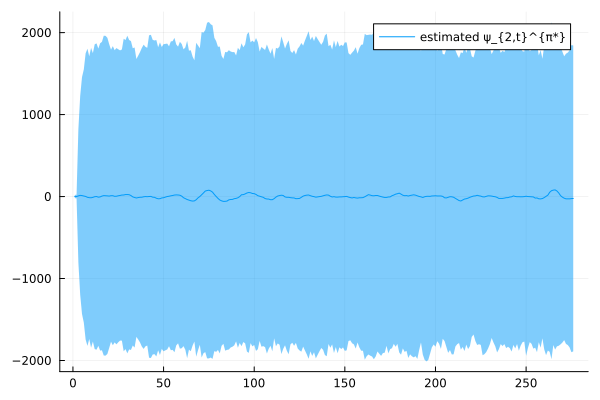

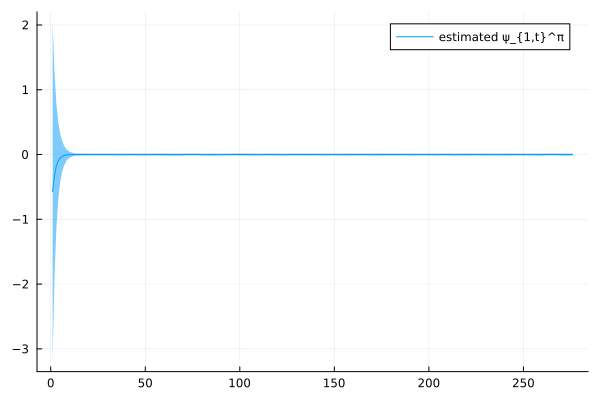

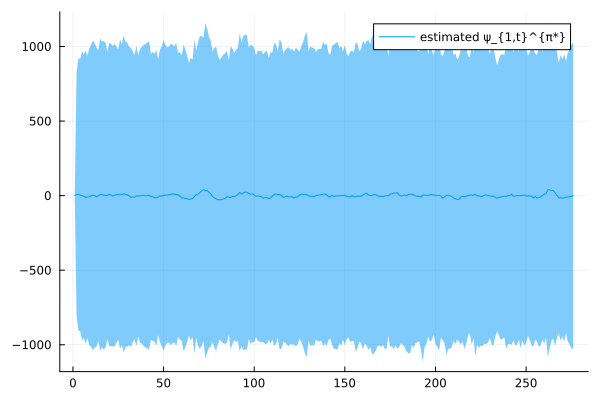

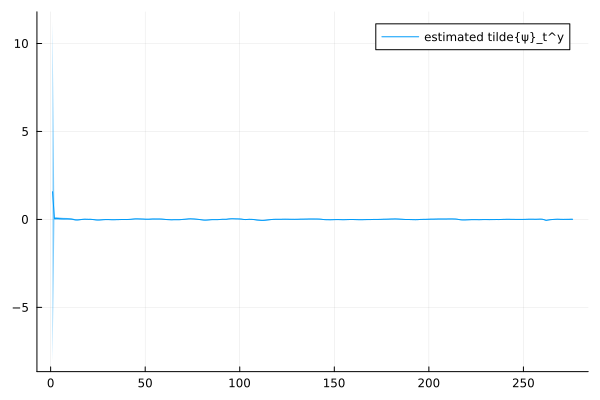

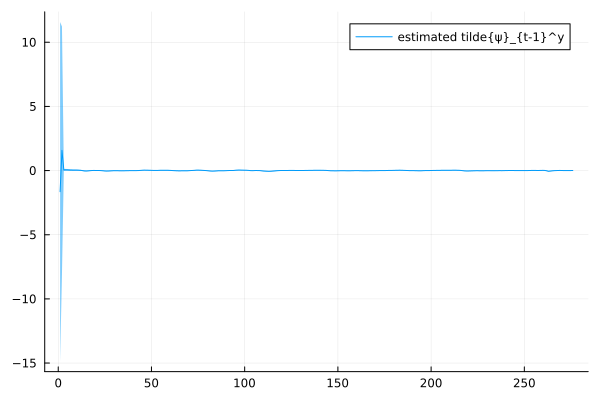

In [18]:
# Compute the mean over iterations (dimension 1)
α_mean = mean(α_draws, dims=1)
println("Mean of α_draws: ", size(α_mean))

# Compute the 2.5% and 97.5% quantiles 
α_ci = mapslices(x -> quantile(x, [0.025, 0.975]), α_draws, dims=1)



# Plot true states, mean of states, and confidence intervals of states
for i in 1:size(α_mean, 2)
    plot(α_mean[1, i, :], ribbon=(α_ci[2, i, :] .- α_mean[1, i, :]), label="estimated $(α_elements[i])")
    if simulate
        plot!(α[i, :], label="true $(α_elements[i])")
    end
    display(plot!())
end


## MLE

In [19]:
# using Optim


# lower_bounds = [0.0, 0.0, 1e-12, 1e-12, 1e-12]
# upper_bounds = [1.0, 3.0, 3.0, 3.0, 3.0]
# θ_init = [0.5, 0.1, 4*10e-5, 4*10e-6, 6*10e-5]

# objective(θ) = neg_log_likelihood(θ, y, α0, P0, cycle_order, σʸ)
# res = optimize(objective, lower_bounds, upper_bounds, θ_init, Fminbox(BFGS()))
# θ_est = Optim.minimizer(res)

# # Print the results:
# println("MLE Results (with bounded optimization):")
# for (i, param_name) in enumerate(θ_elements)
#     println("Estimated $(param_name): $(θ_est[i])   (True value: $(θ_true[i]))")
# end
# println("Final negative log-likelihood: ", Optim.minimum(res))


In [20]:
# # estimate states
# LogL_diff, α_diff, P_diff = diffuse_kalman_filter(y, θ_est, α0, P0, cycle_order, σʸ,  true, false)

# #plot estimated states and true states
# for i in 1:size(α,2)
#     plot(α[:,i], label="true $(α_elements[i])")
#     plot!(α_diff[:,i], label="estimated $(α_elements[i])")
#     display(plot!())
# end

